In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

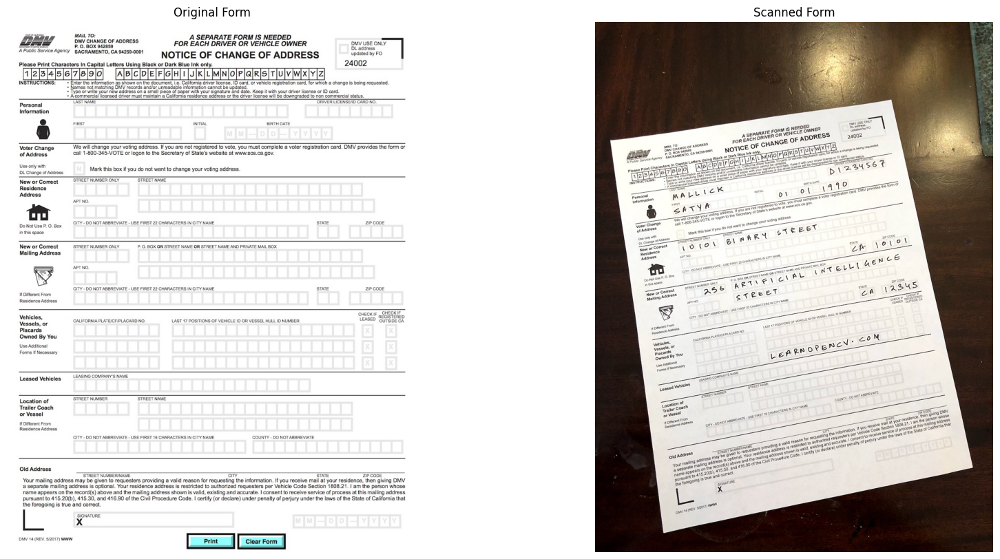

In [3]:
img_form = 'data/images/form.jpg'
img_form = cv2.imread(img_form, cv2.IMREAD_COLOR)

# Read image of the scanned form to be aligned.
img_scan = "data/images/scanned-form.jpg"
img_scan = cv2.imread(img_scan, cv2.IMREAD_COLOR)

# Display the images.
plt.figure(figsize = [20, 10])
plt.subplot(121); plt.axis('off'); plt.imshow(img_form[:, :, ::-1]); plt.title("Original Form")
plt.subplot(122); plt.axis('off'); plt.imshow(img_scan[:, :, ::-1]); plt.title("Scanned Form");

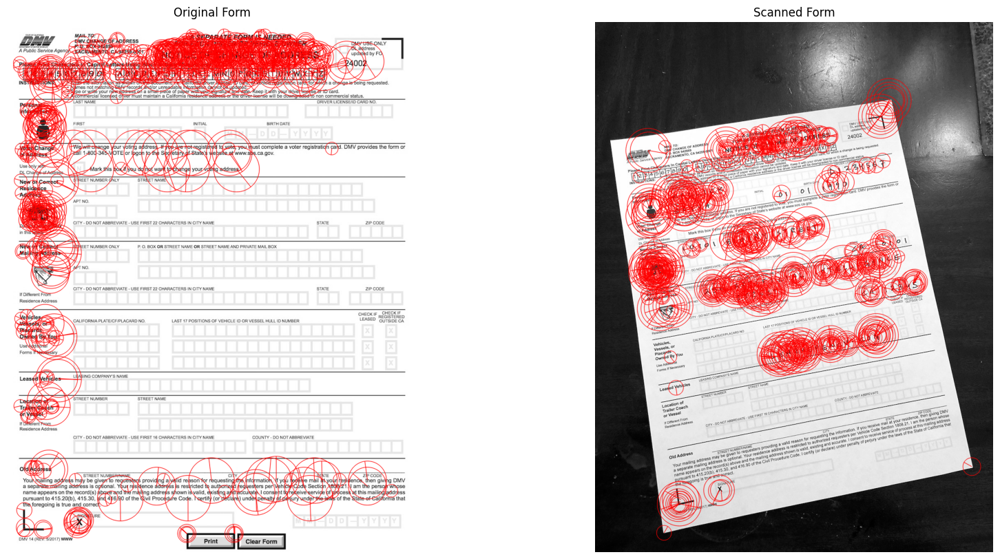

In [4]:
# Convert images to grayscale.
img_form_gray = cv2.cvtColor(img_form, cv2.COLOR_BGR2GRAY)
img_scan_gray = cv2.cvtColor(img_scan, cv2.COLOR_BGR2GRAY)

# Detect keypoints and compute descriptors.
orb = cv2.ORB_create(nfeatures = 600)
keypoints1, descriptors1 = orb.detectAndCompute(img_form_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(img_scan_gray, None)

# Draw the keypoints in both images.
img_form_keypoints = cv2.drawKeypoints(img_form_gray, keypoints1, None,
                                       color = (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_scan_keypoints = cv2.drawKeypoints(img_scan_gray, keypoints2, None,
                                       color = (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the images with the keypoints.
plt.figure(figsize = [20,10])
plt.subplot(121); plt.axis('off'); plt.imshow(img_form_keypoints); plt.title("Original Form")
plt.subplot(122); plt.axis('off'); plt.imshow(img_scan_keypoints); plt.title("Scanned Form");

In [5]:
idx = 0
print(img_form_gray.shape)
print ("")
print ("Template Form:")
print ("")
print ("keypoint angle: ", keypoints1[idx].angle)
print ("keypoint size:  ", keypoints1[idx].size)
print ("keypoint x:     ", keypoints1[idx].pt[0])
print ("keypoint y:     ", keypoints1[idx].pt[1])
print ("")
print ("Descriptor: ", descriptors1[idx])
print ("")

print ("Scanned Form:")
print ("")
print ("keypoint angle: ", keypoints2[idx].angle)
print ("keypoint size:  ", keypoints2[idx].size)
print ("keypoint x:     ", keypoints2[idx].pt[0])
print ("keypoint y:     ", keypoints2[idx].pt[1])
print ("")
print ("Descriptor: ", descriptors2[idx])
print ("")

(1293, 1000)

Template Form:

keypoint angle:  269.11480712890625
keypoint size:   31.0
keypoint x:      587.0
keypoint y:      75.0

Descriptor:  [ 79 152 118 210 100 155 248  48 237 186  63 171  78  61 150  33 167 181
 255  47 212 249  37 252  30  95  81 194  71 175  65  85]

Scanned Form:

keypoint angle:  6.837375164031982
keypoint size:   31.0
keypoint x:      373.0
keypoint y:      319.0

Descriptor:  [ 41 145  96  79 221 212 195 189  83  65 108   4  48 216 190 244  88 138
  18  76 223  58 246 157 110  61 128 104 127 142 216 222]



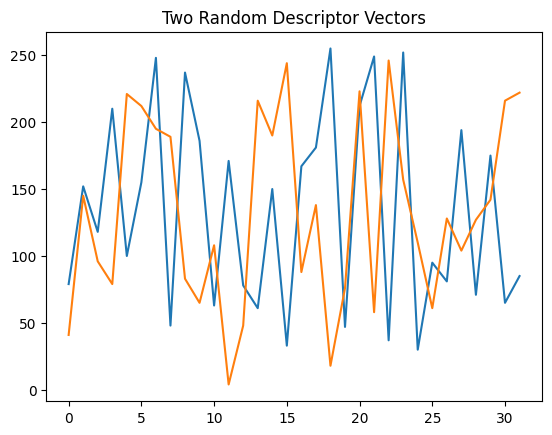

In [6]:
d1 = descriptors1[0] # Form
d2 = descriptors2[0] # Scan
plt.plot(d1)
plt.plot(d2)
plt.title("Two Random Descriptor Vectors");

In [7]:
# Match features.
matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)

matches = matcher.match(descriptors1, descriptors2, None)

# Sort matches by score.
matches = sorted(matches, key = lambda x: x.distance, reverse = False)

# Retain only the top 10% of matches.
numGoodMatches = int(len(matches) * 0.10)
matches = matches[:numGoodMatches]

In [8]:
idx = 0 # First index for best match.

qdx = matches[idx].queryIdx
tdx = matches[idx].trainIdx

print ("")
print ("keypoint angle: ", keypoints1[qdx].angle)
print ("keypoint size:  ", keypoints1[qdx].size)
print ("keypoint x:     ", keypoints1[qdx].pt[0])
print ("keypoint y:     ", keypoints1[qdx].pt[1])
print ("")
print ("descriptor1: ", descriptors1[qdx])
print ("")

print ("")
print ("keypoint angle: ", keypoints2[tdx].angle)
print ("keypoint size:  ", keypoints2[tdx].size)
print ("keypoint x:     ", keypoints2[tdx].pt[0])
print ("keypoint y:     ", keypoints2[tdx].pt[1])
print ("")
print ("descriptor2: ", descriptors2[tdx])
print ("")


keypoint angle:  283.39520263671875
keypoint size:   64.28160858154297
keypoint x:      89.16481018066406
keypoint y:      238.4640350341797

descriptor1:  [ 25 207  66 172 148 147 207 245  68   4  92 230  97  99 179 196  88 106
   6 238 201 186  36 189 168 229 166 128  63 154 248 168]


keypoint angle:  278.00213623046875
keypoint size:   44.6400032043457
keypoint x:      139.6800079345703
keypoint y:      460.8000183105469

descriptor2:  [ 57 207  66 174 148 147 207 245  68   4  92 230 113 225 179 196 124 106
   6 238 201 186  36 189 224 205 166 128  63 186 248 168]



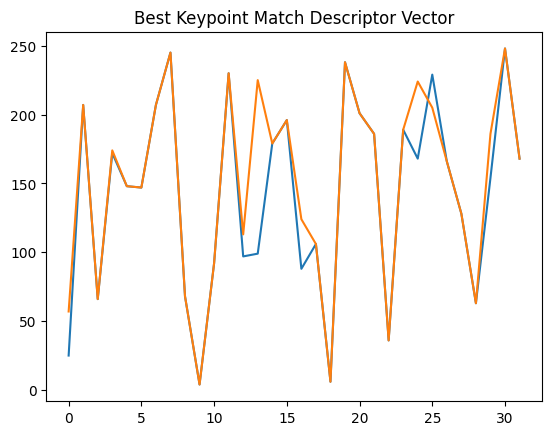

In [9]:
idx = 0 # First index for best match.
d1 = descriptors1[matches[idx].queryIdx]
d2 = descriptors2[matches[idx].trainIdx]
plt.plot(d1)
plt.plot(d2)
plt.title("Best Keypoint Match Descriptor Vector");

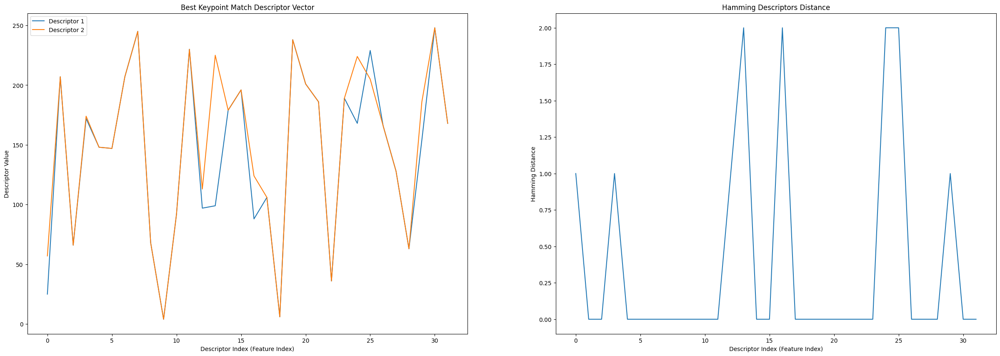

In [10]:
# Calculate Hamming distance for each keypoint descriptor
hamm_match_dist_per_key = []
for iDes in range(len(d1)):
    hamm_match_dist_per_key.append(bin(d1[iDes] ^ d2[iDes]).count('1'))

# Display the final results
plt.figure(figsize=[30, 10])

# First plot - Descriptor vectors
plt.subplot(121)
plt.plot(d1, label='Descriptor 1')
plt.plot(d2, label='Descriptor 2')
plt.title("Best Keypoint Match Descriptor Vector")
plt.xlabel("Descriptor Index (Feature Index)")  # X-axis: Descriptor index
plt.ylabel("Descriptor Value")  # Y-axis: Descriptor valu
plt.legend()

# Second plot - Hamming descriptor distances
plt.subplot(122)
plt.plot(hamm_match_dist_per_key)
plt.xlabel("Descriptor Index (Feature Index)")  # X-axis: Descriptor index
plt.ylabel("Hamming Distance")  # Y-axis: Hamming distance
plt.title("Hamming Descriptors Distance")

# Show the plots
plt.show()

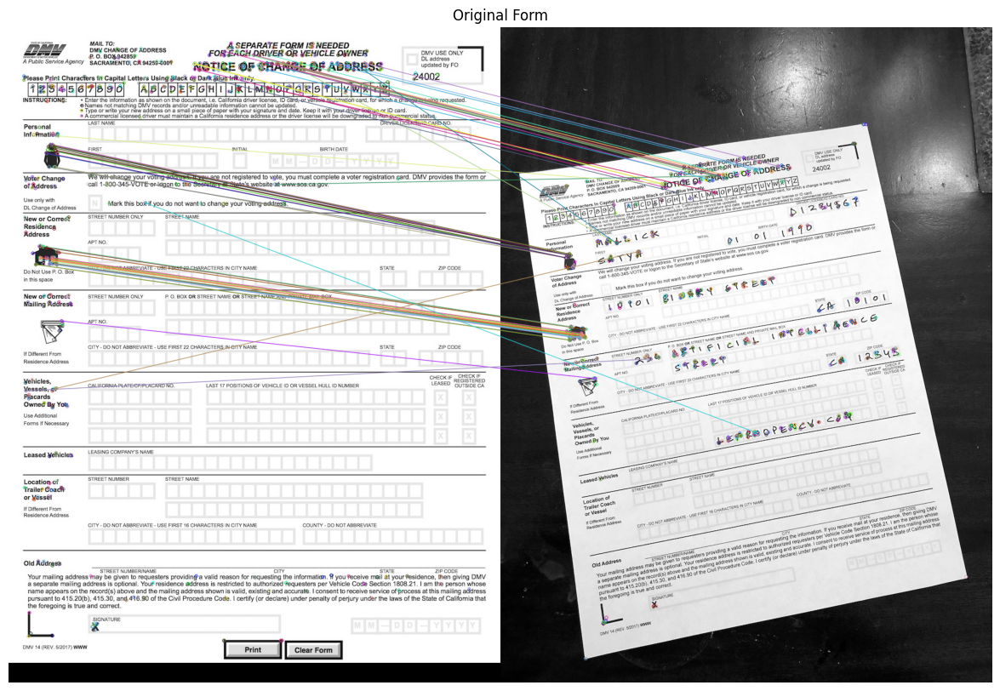

In [11]:
# Draw top matches.
im_matches = cv2.drawMatches(img_form_gray, keypoints1, img_scan_gray, keypoints2, matches, None)

plt.figure(figsize = [40,10])
plt.imshow(im_matches); plt.axis('off'); plt.title("Original Form");

In [12]:
points1 = np.zeros((len(matches), 2), dtype = np.float32)
points2 = np.zeros((len(matches), 2), dtype = np.float32)

for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt

h, mask = cv2.findHomography(points2, points1, cv2.RANSAC)

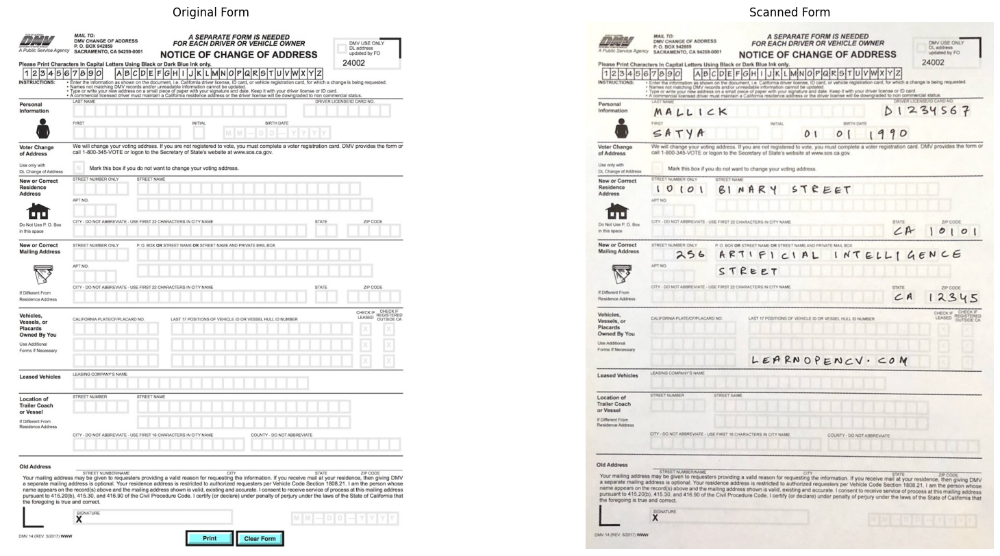

In [13]:
height, width, channels = img_form.shape
img_scan_reg = cv2.warpPerspective(img_scan, h, (width, height))

# Display the final results.
plt.figure(figsize = [20,10])
plt.subplot(121); plt.imshow(img_form[:, :, ::-1]);     plt.axis('off'); plt.title("Original Form")
plt.subplot(122); plt.imshow(img_scan_reg[:, :, ::-1]); plt.axis('off'); plt.title("Scanned Form");

#### Application: Creating Panaroma

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
import glob
%matplotlib inline
import matplotlib
plt.rcParams['image.cmap'] = 'gray'

In [5]:
image_file1 = "data/images/scenes/scene1.jpg"  # Reference image.
image_file2 = "data/images/scenes/scene3.jpg"  # Image to be aligned.

# Read the images.
img1 = cv2.imread(image_file1, cv2.IMREAD_COLOR)
img2 = cv2.imread(image_file2, cv2.IMREAD_COLOR)


# Convert images to grayscale.
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

In [6]:
MAX_FEATURES = 500 
orb = cv2.ORB_create(MAX_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(img1_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(img2_gray, None)

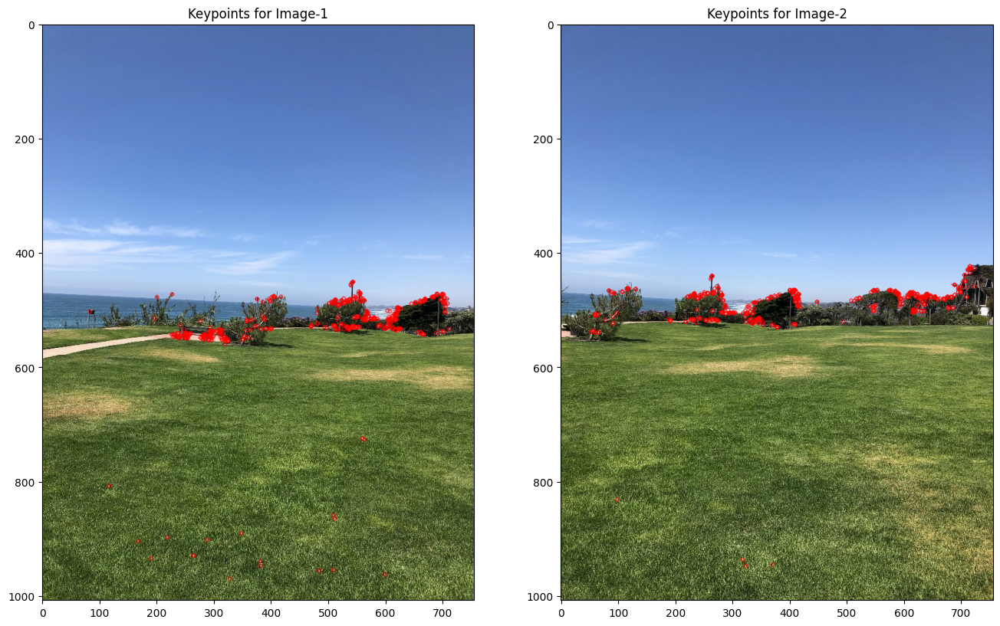

In [7]:
img1_keypoints = cv2.drawKeypoints(img1, keypoints1, None, color = (0,0,255),flags = cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2_keypoints = cv2.drawKeypoints(img2, keypoints2, None, color = (0,0,255),flags = cv2.DRAW_MATCHES_FLAGS_DEFAULT)

plt.figure(figsize = [16, 10])
plt.subplot(121); plt.imshow(img1_keypoints[:,:,::-1]); plt.title("Keypoints for Image-1")
plt.subplot(122); plt.imshow(img2_keypoints[:,:,::-1]); plt.title("Keypoints for Image-2");

In [8]:
matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches = matcher.match(descriptors1, descriptors2, None)

# Sort matches by score
matches = sorted(matches, key = lambda x: x.distance, reverse = False)

# Retain only a percenatge of the better matches.
GOOD_MATCH_PERCENT = 0.15
numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
matches = matches[:numGoodMatches]

# Draw top matches
img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches, None)

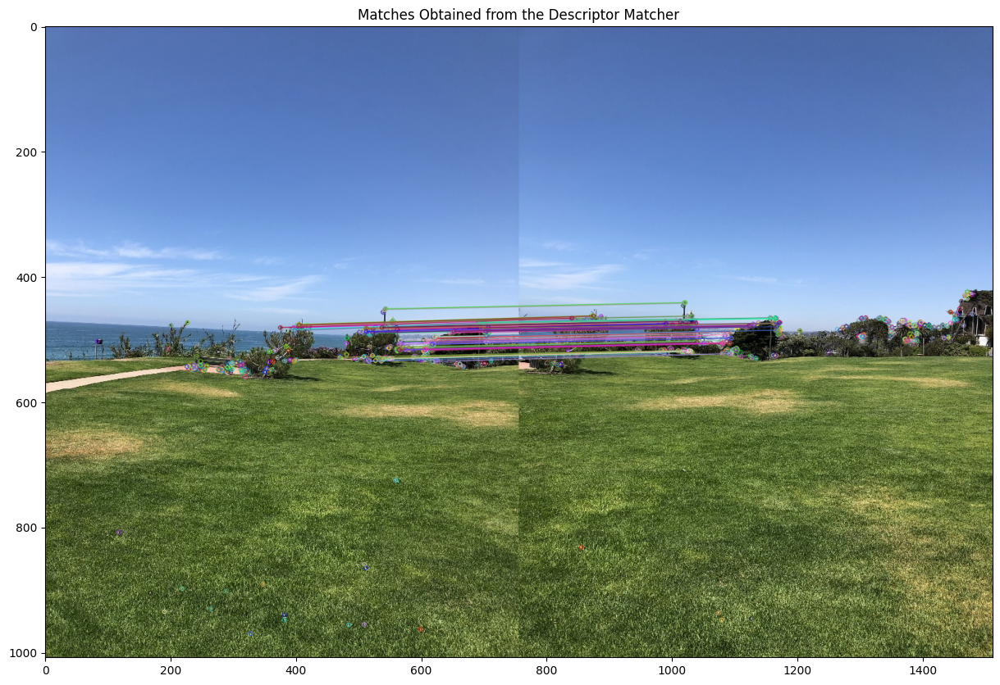

In [9]:
plt.figure(figsize = [15,10])
plt.imshow(img_matches[:,:,::-1])
plt.title("Matches Obtained from the Descriptor Matcher");

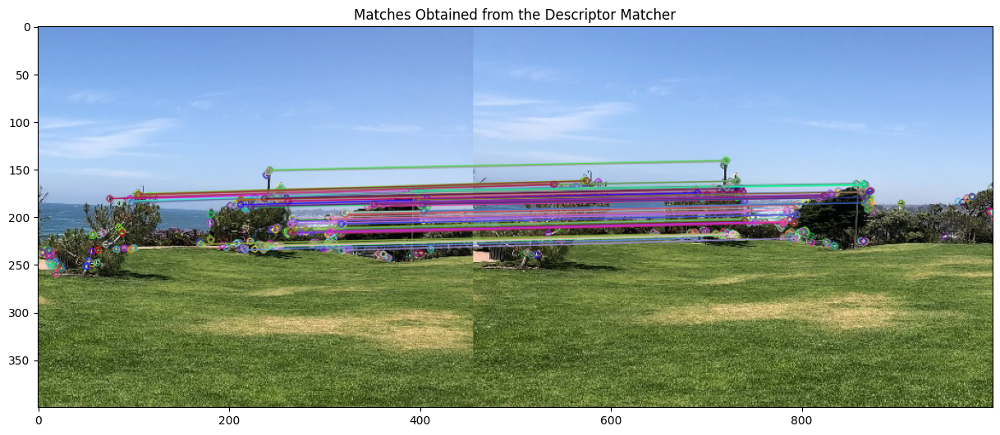

In [10]:
zoom_x1 = 300; zoom_x2 = 1300
zoom_y1 = 300; zoom_y2 = 700

plt.figure(figsize = [15,10])
img_matches_zoom = img_matches[zoom_y1:zoom_y2, zoom_x1:zoom_x2]
plt.imshow(img_matches_zoom[:,:,::-1])
plt.title("Matches Obtained from the Descriptor Matcher");

In [11]:
points1 = np.zeros((len(matches), 2), dtype = np.float32)
points2 = np.zeros((len(matches), 2), dtype = np.float32)

for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt

# Find homography.
h, mask = cv2.findHomography(points2, points1, cv2.RANSAC)

In [12]:
# Warp time the perspective of the 2nd image using the homography.
img1_h, img1_w, channels = img1.shape
img2_h, img2_w, channels = img2.shape

img2_aligned = cv2.warpPerspective(img2, h, (img2_w + img1_w, img2_h))

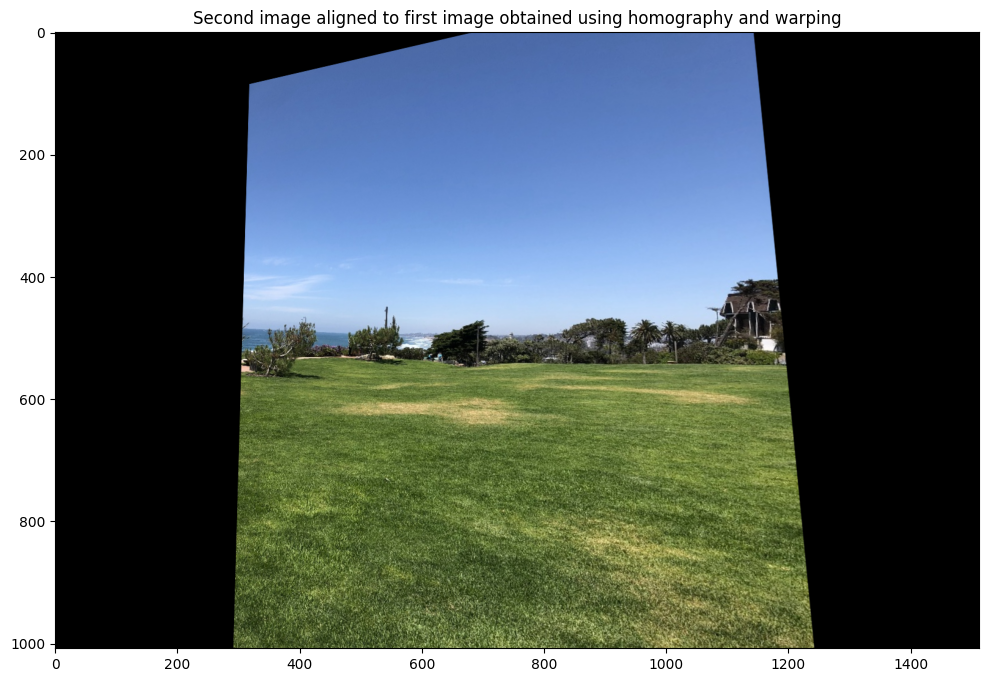

In [13]:
plt.figure(figsize = [15,8])
plt.imshow(img2_aligned[:,:,::-1])
plt.title("Second image aligned to first image obtained using homography and warping");

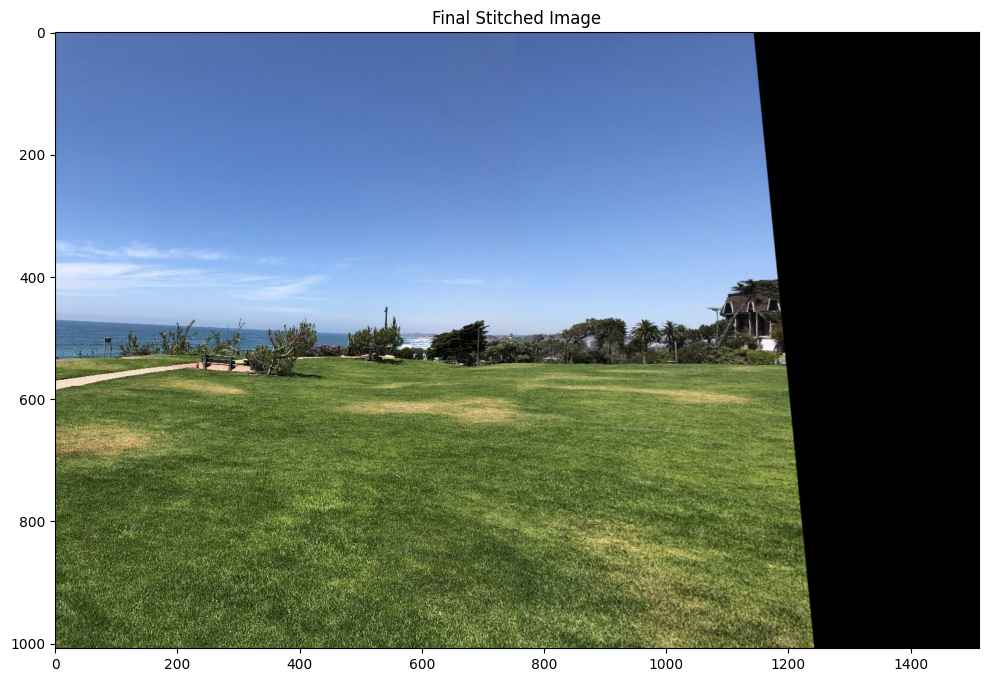

In [14]:
stitched_image = np.copy(img2_aligned)
stitched_image[0:img1_h, 0:img1_w] = img1
plt.figure(figsize = [15, 8])
plt.imshow(stitched_image[:,:,::-1])
plt.title("Final Stitched Image");

In [15]:
imagefiles = glob.glob('data/images/scenes/*')
imagefiles.sort()
print(imagefiles)

images = []
for filename in imagefiles:
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)

num_images = len(images)

['data/images/scenes\\scene1.jpg', 'data/images/scenes\\scene2.jpg', 'data/images/scenes\\scene3.jpg', 'data/images/scenes\\scene4.jpg', 'data/images/scenes\\scene5.jpg', 'data/images/scenes\\scene6.jpg', 'data/images/scenes\\scene7.jpg', 'data/images/scenes\\scene8.jpg']


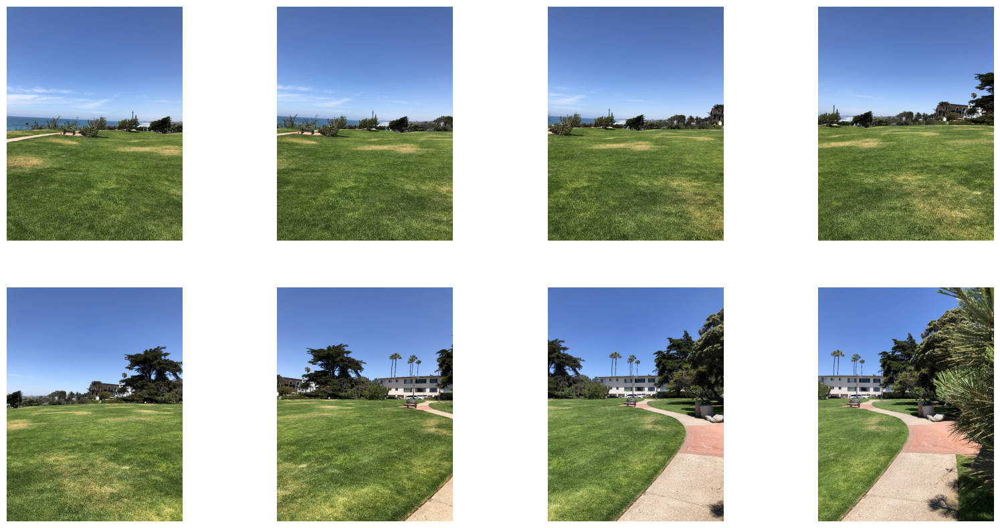

In [16]:
plt.figure(figsize = [20,10]) 
num_cols = 4
num_rows = math.ceil(num_images / num_cols)
for i in range(0, num_images):
    plt.subplot(num_rows, num_cols, i+1) 
    plt.axis('off')
    plt.imshow(images[i]);

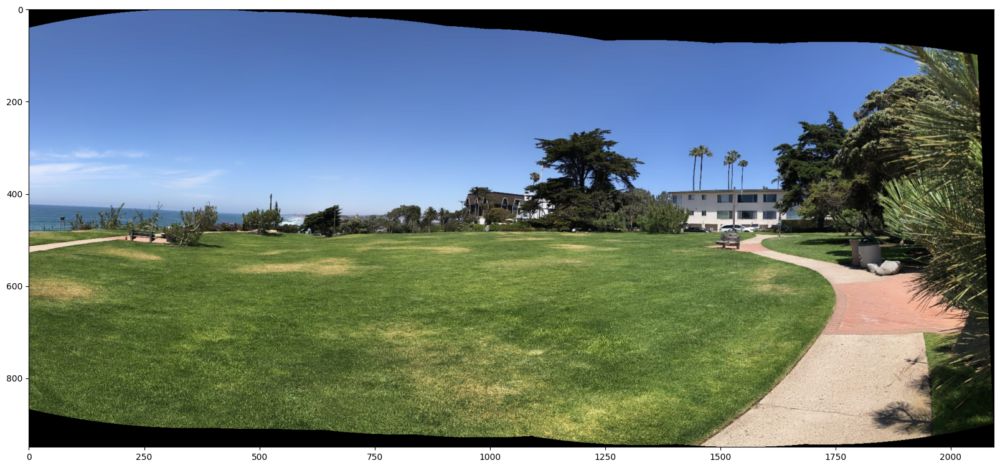

In [17]:
stitcher = cv2.Stitcher_create()
status, panorama = stitcher.stitch(images)
if status == 0:
    plt.figure(figsize = [20,10]) 
    plt.imshow(panorama)

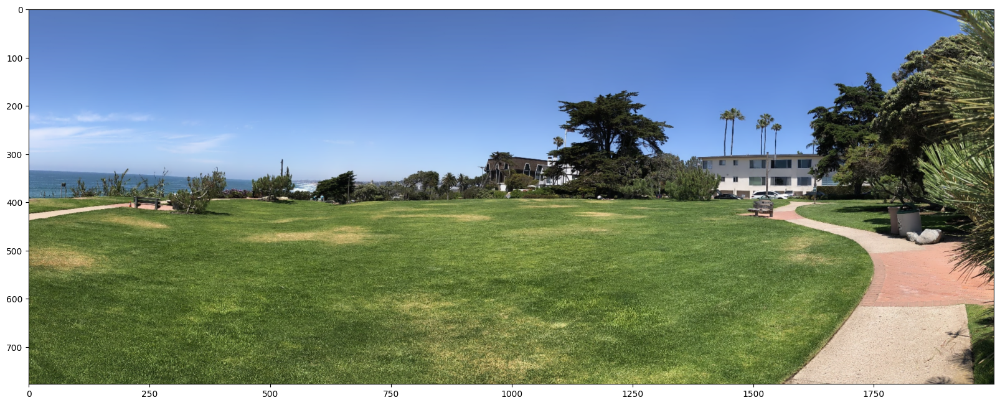

In [18]:
plt.figure(figsize = [20,10]) 
plt.imshow(panorama)
cropped_region = panorama[90:867, 1:2000]
plt.imshow(cropped_region);